# Deep Learning Term Project CS60010 Spring Semester 2024  
## Task: Build encoder decoder models for Automatic Image Captioning  
## Dataset:
https://drive.google.com/file/d/1FMVcFM78XZE1KE1rIkGBpCdcdI58S1LB/view?usp=sharing  
#### Related papers:   
https://aclanthology.org/P18-1238.pdf  
https://arxiv.org/pdf/1411.4555.pdf


### Input:  
![](https://i.imgur.com/ZqjnN88.jpeg)

### Output:  
*An ornate clock tower made of grey stone features balconies under each clock face.  Embellished in gilded gold carvings, each clack has a blue face.  Gold urns are attached to each corner of the balconies.  The vapor trail of a lone jet is all the breaks the clear blue sky overhead. A filigree metal railing frames the upper section of the tower that houses a bell.*

### Resources
1. Tensorflow documentation tutorials - https://www.tensorflow.org/tutorials/
2. Hands on Machine Learning Book

# Part 2: VIT based pre-trained encoder and RNN (LSTM) based decoder

### Loading Dataset
https://www.tensorflow.org/tutorials/load_data/images

In [1]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
from transformers import TFViTForImageClassification, create_optimizer, ViTImageProcessor
from transformers import AutoImageProcessor, TFViTModel
!pip install pycocoevalcap
from pycocoevalcap.rouge.rouge import Rouge
from pycocoevalcap.cider.cider import Cider
from pycocoevalcap.spice.spice import Spice
from pycocoevalcap.bleu.bleu import Bleu

2024-04-17 15:06:33.290544: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-17 15:06:33.290639: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-17 15:06:33.401919: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.3/104.3 MB 15.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 426.2/426.2 kB 25.1 MB/s eta 0:00:00


<h3> Data Preparation </h3>

In [2]:
batch_size = 32
img_ht = 224
img_wd = 224
data_dir = "/kaggle/input/image-captioning-dataset/custom_captions_dataset/train"
data_dir_v = "/kaggle/input/image-captioning-dataset/custom_captions_dataset/val"
data_dir_t = "/kaggle/input/image-captioning-dataset/custom_captions_dataset/test"

train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir, #directory of dataset
  labels = None, #labels are not there. default is not NONE
  color_mode = "rgb", #default,
  image_size=(img_ht, img_wd), #for rescaling all images to 256*256. Lets not batch now
  batch_size=None,
  shuffle = False)

valid_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir_v, #directory of dataset
  labels = None, #labels are not there. default is not NONE
  color_mode = "rgb", #default,
  image_size=(img_ht, img_wd), #for rescaling all images to 256*256
  batch_size=None,
  shuffle = False)

test_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir_t, #directory of dataset
  labels = None, #labels are not there. default is not NONE
  color_mode = "rgb", #default,
  image_size=(img_ht, img_wd), #for rescaling all images to 256*256
  batch_size=None,
  shuffle = False)


Found 5715 files belonging to 1 classes.
Found 946 files belonging to 1 classes.
Found 928 files belonging to 1 classes.


<h2> Encoder </h2>

<h4>We downloaded the pretrained ViT model and did a forward pass of train images. We saved the output of the last hidden state in 'encoder_out1.npy' file. Thereafter, we just load the weights everytime to pass to the decoder. </h4>

In [3]:
%%script false --no-raise-error
a = np.empty([])
i = 1
for item in train_ds.batch(500):
    print(f'{i} start')
    encoder_inputs = tf.keras.layers.Rescaling(scale = 1/255)(item)
    inputs = image_processor(encoder_inputs, return_tensors="tf", do_rescale = False)
    outputs = modelpre(**inputs)
    if i == 1:
        a = outputs.last_hidden_state.numpy()
    else:
        a = np.append(a,outputs.last_hidden_state.numpy(),axis=0)
    i = i + 1
    print(f'{i} end')
np.save('encoder_out.npy', a)

<h4> Loading outputs of last hidden state of ViT </h4>

In [4]:
image_embeddings = np.load('/kaggle/input/image-vit-output/encoder_out1.npy')
print(image_embeddings.shape)
train_embedding_ds = tf.data.Dataset.from_tensor_slices(image_embeddings)

(5715, 197, 768)


<h4> We added a dense layer on top of the output of the standard ViT encoder so that it can encode the images better for our particular task (Caption generation). </h4>

In [5]:
encoder_input = tf.keras.layers.Input(shape = [197,768])
X = tf.keras.layers.Dropout(0.4)(encoder_input)
dense_layer = tf.keras.layers.Dense(768)
encoder_output = dense_layer(X)

## Prerpcocessing of text data

#### Loading Text Data
We will use from_tensor_slices method :https://www.tensorflow.org/api_docs/python/tf/data/Dataset

Page 585, HOML for example   
and how to handle tf.data - see HOML, page 442

#### Text preprocessing

It has 2 Steps
1. Creating Tokens - tokenization: It has many methods  
    *     character based tokenization  - can use Text Vectorization layer (also does some cleaning)  
    *     words based tokenization  - can use Text Vectorization layer  
    *     subword based tokenization (BPE) and other methods - Can use Tensorflow Text method   
2. Adding Embedding layer

We here follow HOML, page 598

In [6]:
import pandas as pd
train_file = pd.read_csv("/kaggle/input/image-captioning-dataset/custom_captions_dataset/train.csv")
import os
list_dir = os.listdir("/kaggle/input/image-captioning-dataset/custom_captions_dataset/train")
list_dir.sort() #this will store all the files in sorted manner the way, it has been stored in images.
train_text = pd.Series(train_file["caption"].to_list(), index = train_file['filename']) # here index is image file name and val is text
train_text = train_text[list_dir].to_list() #this restore order of text file acc to image files.
test_file = pd.read_csv("/kaggle/input/image-captioning-dataset/custom_captions_dataset/test.csv")
val_file = pd.read_csv("/kaggle/input/image-captioning-dataset/custom_captions_dataset/val.csv")
full_corpus = train_text + test_file['caption'].to_list() + val_file['caption'].to_list()

<h3> Text Preprocessing: Text Loading, Cleaning and Vectorization </h3

In [7]:
#initializing TextVectorization layer

vec_layer = tf.keras.layers.TextVectorization(
    standardize='lower',  #little cleaning done here: lower_and_strip_punctuation also possible
    split='whitespace',
    output_sequence_length=90
)

#creating vocab
vec_layer.adapt([f"sos {s} eos" for s in full_corpus])
#we are writing in small since it will be later anyways force to be lowercaps
voc = vec_layer.get_vocabulary()
voc_len = len(voc)

In [8]:
#heres's how create dataset from list
X_train_text = [f"sos {s}" for s in train_text]
Y_train_text = vec_layer([f"{s} eos" for s in train_text])  #for train, we need output of vectorization layer so that it act as class in softmax layer.
X_train_text_ds = tf.data.Dataset.from_tensor_slices(X_train_text)
Y_train_text_ds = tf.data.Dataset.from_tensor_slices(Y_train_text)

In [9]:
test_file = test_file.sort_values(by=['filename'])
test_file['caption_X'] = "sos " + test_file['caption']
test_file["caption_Y"] = test_file['caption'] + " eos"
X_test_text_ds = tf.data.Dataset.from_tensor_slices(test_file["caption_X"])
Y_test_text_ds = tf.data.Dataset.from_tensor_slices(vec_layer(test_file["caption_Y"]))

val_file = val_file.sort_values(by=['filename'])
val_file['caption_X'] = "sos " + val_file['caption']
val_file["caption_Y"] = val_file['caption'] + " eos"
X_val_text_ds = tf.data.Dataset.from_tensor_slices(val_file["caption_X"])
Y_val_text_ds = tf.data.Dataset.from_tensor_slices(vec_layer(val_file["caption_Y"]))

vocab_len = len(vec_layer.get_vocabulary())

<h3> Eagerly function </h3>
Calling tf.config.run_functions_eagerly(True) will make all invocations of tf.function run eagerly instead of running as a traced graph function. This can be useful for debugging. As the code now runs line-by-line, you can add arbitrary print messages or pdb breakpoints to monitor the inputs/outputs of each Tensorflow operation. However, you should avoid using this for actual production because it significantly slows down execution.
I was getting error in model.predict, after putting this function on, It is running fine. 

In [10]:
tf.config.run_functions_eagerly(True)  # required for model.predict()

### Creating Decoder - RNN (LSTM)
We are following HOML machine translation example - pg 598

To read about RNN - See HOML, chapter 15, page 556 (very very important) and https://www.tensorflow.org/guide/keras/working_with_rnns. Concepts like stacking, return_state are discussed

In [11]:
decoder_input = tf.keras.layers.Input(shape = [], dtype = tf.string) 
embed_size = 768
decoder_input_id_vec = vec_layer(decoder_input)
decoder_embeding_layer = tf.keras.layers.Embedding(vocab_len, embed_size, mask_zero = True) #mask zero true is necessary for RNNs, see documentary of Embedding layerembedding_layer.build((1,))

decoder_embedding = decoder_embeding_layer(decoder_input_id_vec)
decoder_embedding = tf.keras.layers.Dropout(0.4)(decoder_embedding)

decoder_LSTM = tf.keras.layers.LSTM(embed_size, return_sequences = True)
decoder_LSTM_output = decoder_LSTM(decoder_embedding)

cross_attn_layer = tf.keras.layers.MultiHeadAttention(num_heads=1, 
                                    key_dim=embed_size, dropout=0.2)

encoder_output_mod = cross_attn_layer(decoder_LSTM_output, value = encoder_output,)

full_output = tf.keras.layers.Add()([decoder_LSTM_output, encoder_output_mod])
full_output = tf.keras.layers.Dense(256, activation='relu')(full_output)

output_layer = tf.keras.layers.Dense(vocab_len, activation = "softmax")  
Y_probability_LSTM = output_layer(full_output)

## Creating Model

In [12]:
model2 = tf.keras.Model(inputs = [encoder_input, decoder_input], outputs = [Y_probability_LSTM])
model2.compile(loss = "sparse_categorical_crossentropy", optimizer = "adam", metrics = ["accuracy"])

AUTOTUNE = tf.data.AUTOTUNE
TRAIN_data = tf.data.Dataset.zip((train_embedding_ds, X_train_text_ds), Y_train_text_ds ).batch(128).cache().prefetch(buffer_size = AUTOTUNE)
#TEST_data = tf.data.Dataset.zip((test_ds, X_test_text_ds), Y_test_text_ds ).batch(32).cache().prefetch(buffer_size = AUTOTUNE)
#VAL_data = tf.data.Dataset.zip((valid_ds, X_val_text_ds), Y_val_text_ds ).batch(32).cache().prefetch(buffer_size = AUTOTUNE)

model2.fit(TRAIN_data  , epochs = 101)

Epoch 1/101
45/45 [==============================] - 19s 304ms/step - loss: 6.3932 - accuracy: 0.0901
Epoch 2/101
45/45 [==============================] - 13s 287ms/step - loss: 5.5014 - accuracy: 0.1384
Epoch 3/101
45/45 [==============================] - 13s 291ms/step - loss: 4.8450 - accuracy: 0.2277
Epoch 4/101
45/45 [==============================] - 13s 289ms/step - loss: 4.3362 - accuracy: 0.2679
Epoch 5/101
45/45 [==============================] - 13s 288ms/step - loss: 4.0038 - accuracy: 0.2902
Epoch 6/101
45/45 [==============================] - 13s 288ms/step - loss: 3.7651 - accuracy: 0.3073
Epoch 7/101
45/45 [==============================] - 13s 288ms/step - loss: 3.5834 - accuracy: 0.3194
Epoch 8/101
45/45 [==============================] - 13s 287ms/step - loss: 3.4373 - accuracy: 0.3301
Epoch 9/101
45/45 [==============================] - 13s 293ms/step - loss: 3.3048 - accuracy: 0.3385
Epoch 10/101
45/45 [==============================] - 13s 290ms/step - loss: 3.173

## Inference time : Generating Captions

Refer HOML - page 601 (machine translation)

In [13]:
def caption(image : tf.Tensor):
    text = ""
    for i in range(50):
        X_dec = "sos " + text #decoder input
        tensor_image = tf.expand_dims(image, axis = 0)
        myTensor = tf.convert_to_tensor(X_dec, dtype=tf.string)
        X_dec = tf.expand_dims(myTensor, axis = 0)
        y_probability = model2.predict((tensor_image, X_dec), verbose=0)[0,i] #last_token_probability
        #print(y_probability)
        predicted_word_index = np.argmax(y_probability)
        #print(predicted_word_index)
        predicted_word = vec_layer.get_vocabulary()[predicted_word_index]
        if predicted_word == "eos":
            break
        text = text + " " + predicted_word
    return text

<h3> A Forward pass of test images through ViT encoder and printing the captions </h3>

In [14]:
image_processor = AutoImageProcessor.from_pretrained("google/vit-base-patch16-224-in21k")
modelpre = TFViTModel.from_pretrained("google/vit-base-patch16-224-in21k")

preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

All PyTorch model weights were used when initializing TFViTModel.

All the weights of TFViTModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFViTModel for predictions without further training.


  0%|          | 0/60 [00:00<?, ?it/s]

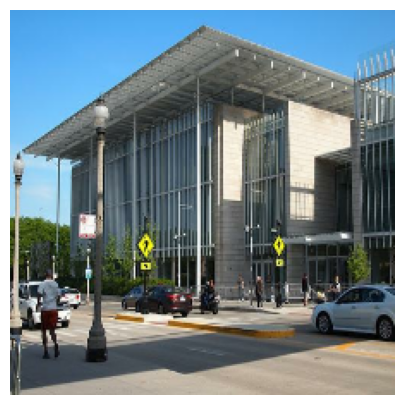

 a large building sits on the street. there are lines from the building. the lines on the street are neon yellow. there are many lines on the building. there are many lines on the building. there are lines on the building. there are lines on the building. there are lines


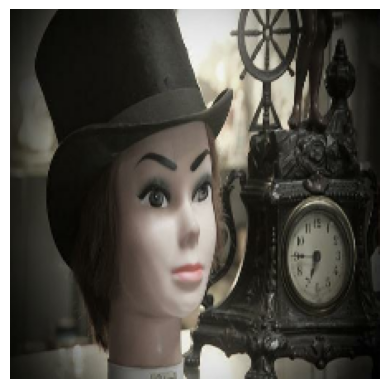

 a man is standing on a motorcycle on a high chair on a high flowing on a high high high high high high high high high high high high in the far far right of the clock. the time is full of chopped bags on them. the clock on the


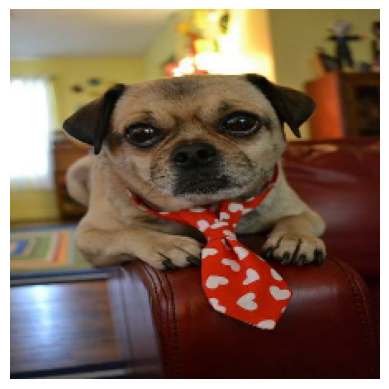

 a dog is laying on the floor. the dog is wearing a tie. the beard is brown. the dog is wearing a tie. the dog is black and white. the dog is very brown. the dog is very light brown. the dog is very big. the dog is wearing a


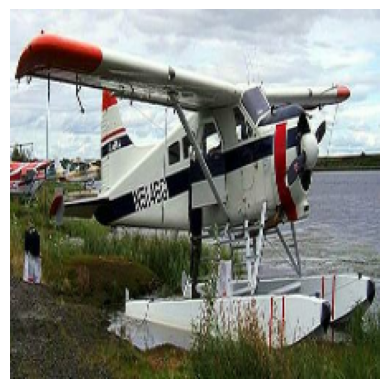

 a man in a striped shirt and white pants is standing in the middle of a glass that has a bat in his hand. the nose of the plane is red. the nose of the plane is red. the plane is white with a yellow heart and white markings on


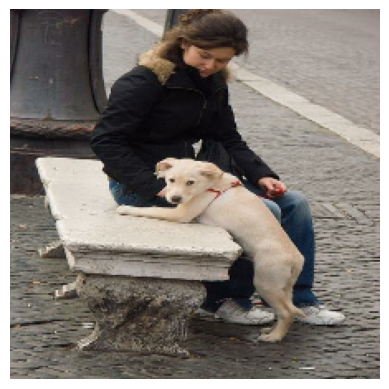

 a woman is sitting on a concrete bench. the sidewalk is blue and has a blue block on it's shoulder. which is a blue and white painted blue and has a blue leash on the woman. the trees across the sidewalk in the street. the sidewalk on the sidewalk has


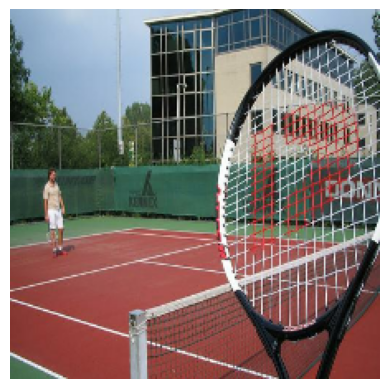

 a man is standing on a tennis court playing tennis. he is wearing a white shirt and white pants. the man is holding a tennis racket in his hand. a green tennis ball is soaring towards her. a green tennis ball is sitting on the other side of the court.


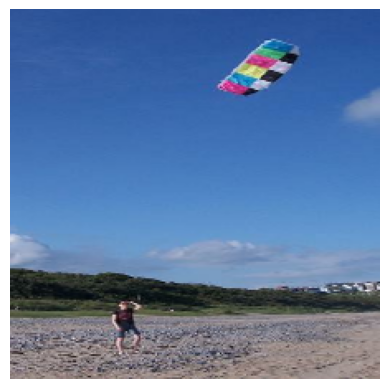

 a man in a blue shirt, and a pink shirt, and a colorful kite is flying in the air toward himself. the kite is in a large field of clear grass. further down the kite is a large white kite with a white and white kite flying in the sand.


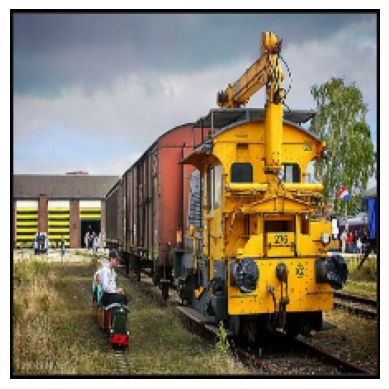

 a flat screen flat train flat is flat on a train track. the train is yellow and yellow in color. there are yellow poles on the bottom of the train and numbers on the engine that are transporting numbers on the front of the train. the train tracks are standing


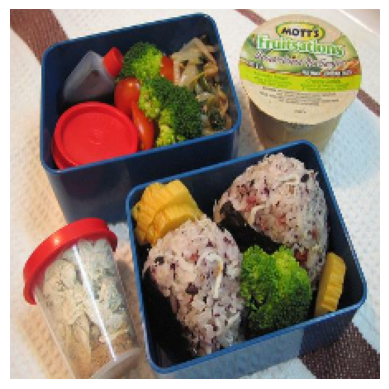

 there are vegetables on the table. the food on the tray is green. the food on the food are kind of food. there are carrots and carrots on the tray. there are carrots on oil carrots and beans. there are carrots on the carrots as well.


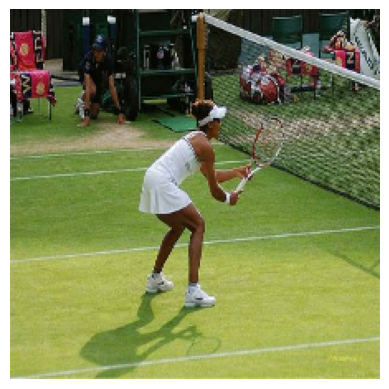

 a woman is playing tennis on a tennis court. she is wearing a white and white shirt and white bottoms. the tennis racket is holding a racket in her hands. a green tennis ball is soaring towards her. a green tennis ball is soaring towards the woman. the court is


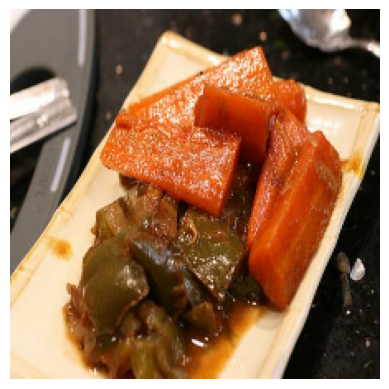

 a pile of food is sitting on a plate. the food is on a wooden plate. the food is a silver color with a black spoon on the plate. the food has a silver cord and a silver cord on it and a spoon on the wrist. under the spoon


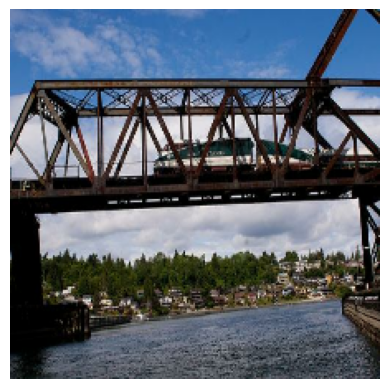

 a picture of a train on the water. the water appears appears to the water. appears appears to be a bridge. the bridge is filled with water. the appears appears to be taking a picture of night water. the sky is appears to be taking a bridge. the appears appears


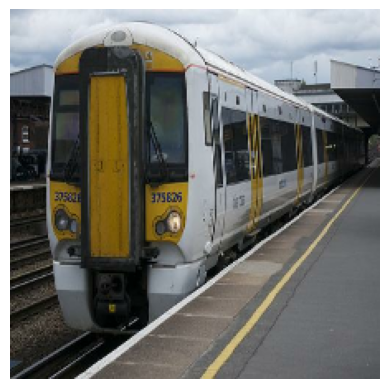

 a white, yellow, and white, and white train is on the tracks at a station. the windows on the front of the train are yellow and mint yellow on the front and mint yellow on the front window are yellow. the windows on the front of the train are painted


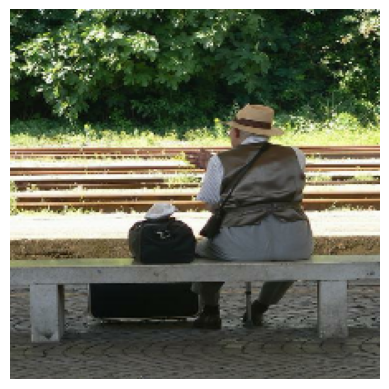

 a woman is bending down on a bench outside on a concrete bench. the woman is wearing a blue tank top and blue jean shorts. the woman is sitting on a bench that is on a concrete wall. there are two white plants behind the bench. a woman with woman


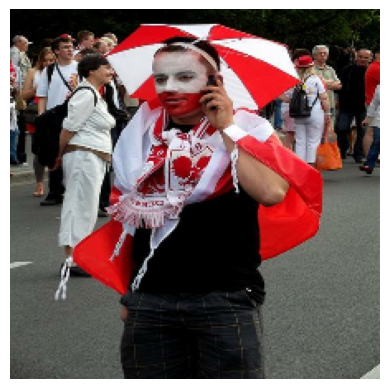

 a young woman is standing on a woman's right of a woman's phone. the woman is wearing a red camera and holding a silver camera in his hands. the man has his camera out on the woman's right hand. the woman is wearing a red and white shirt and a


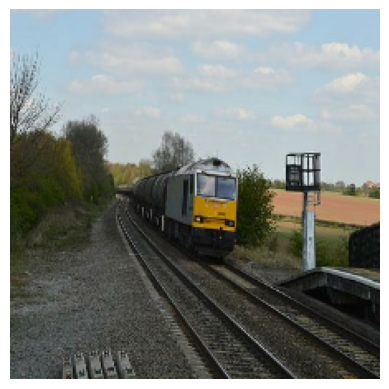

 a flat screen set up in a track that is set on the track and set of tracks in a fenced background on a cloudy day. the train on the track is painted blue, bare and yellow. there are three sets of railroad track on the left and a man


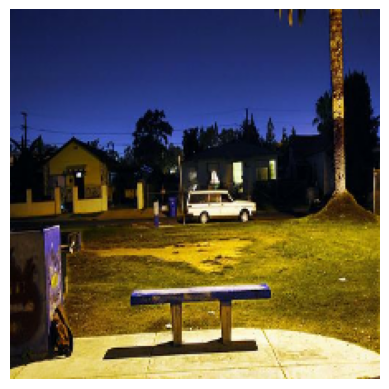

 a tall brown house is sitting on a grassy walkway. the bench is covered in a tall brown and brown stone walkway. a tall brown house is on the street next to the bench. on the street is a tall tower and a home with a brown house on the


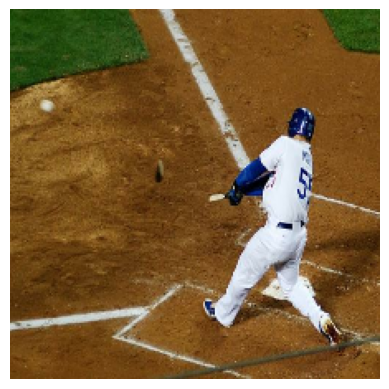

 a baseball player is swing a bat in a bat and swinging a bat in a bat that is behind a bat that is behind a ball that is behind the ball that is behind the ball that is behind the ball that is behind the player. he is wearing


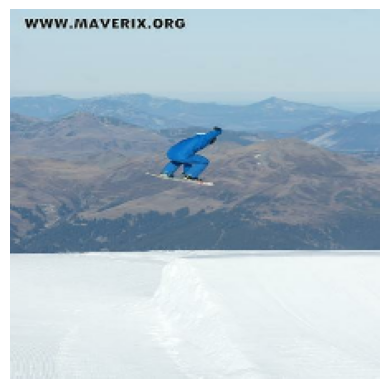

 a kite is flying in the sky. the snow is up to the right of the kite feet. the kite is white and has a white design on the front of its head. a red sign is flying above the wings of the blue sky. there are two long rock


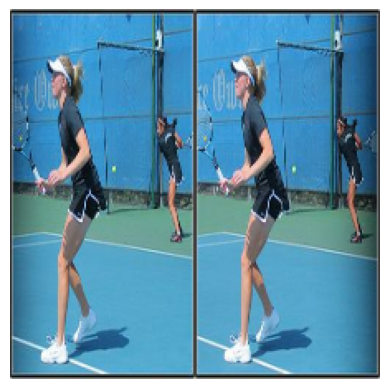

 a woman is hitting a tennis ball. she is wearing a red and white outfit and a red lines. she is holding a racket in her hand. the tennis player has a white hat on and a green tennis ball.


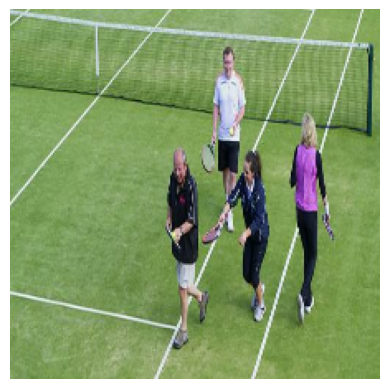

 a man in a white shirt and blue shorts is playing tennis on a tennis court. he is wearing a blue shirt and black shorts and tennis shoes. a woman in black and white tennis shoes are standing behind the tennis court near a tennis net. a man and a


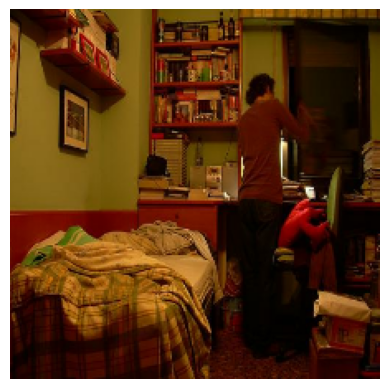

 a white radiator is in a room. there is a white cabinet in front of the bed. there is a white towel hanging from a white shelf on the wall. there is a white towel hanging from a shelf on the wall.


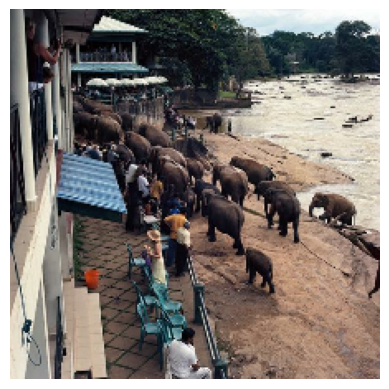

 four elephants are walking in a building. four of the elephants are walking on the sidewalk. next to the animals are four sidewalk. the people are walking on sidewalk. the sidewalk. one of the people walking on the background, are all wearing a shirts.


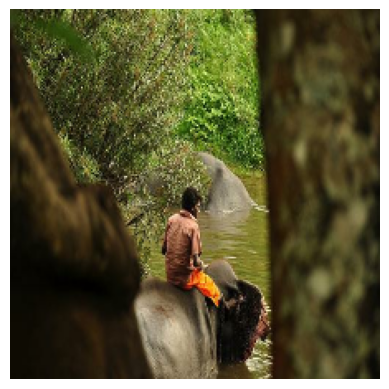

 a man is standing on top of a large tan dog at a top at a top of water. his elephant is wearing a yellow, yellow, and blue hat, a yellow, red, blue and yellow hat. the man is wearing a yellow, red, and blue shirt and blue jean pants.


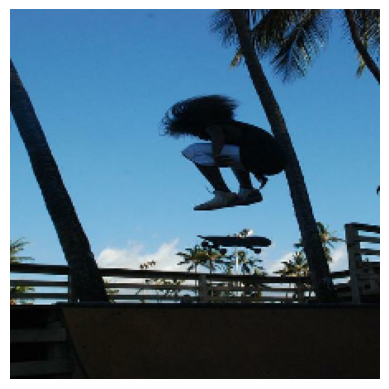

 a man in a blue shirt and a black tank top is in the air on a black and white base in a low park. the boy has his right arm in the air. the base of the railing is black and has a black base and a black base


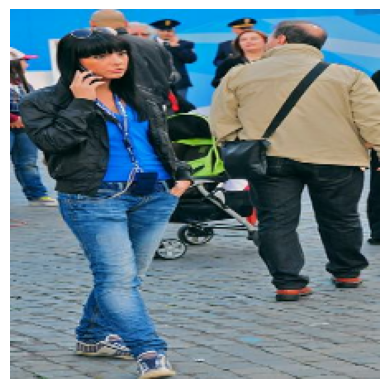

 a man in a blue and white tie is standing on a brown snow mounted on a sidewalk. a man with brown hair is walking on the cement street near a couple of people sitting on a brown bag on the sidewalk. a man and a woman are standing in


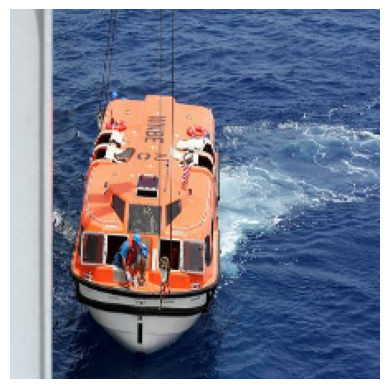

 this is a picture of a picture of a toilet. the toilet is white in color. the white hair on the door is hanging on the window. the white poles on the front and silver hanging on the window. the white and white paint on the window. the white and


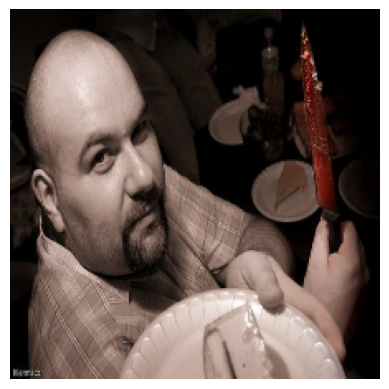

 a big white container setting to the camera with a big white paper collar. the man holding the white frosting is eating a big white paper container with his halfway on the floor. the man is eating a big white paper container with a big white container in his hand


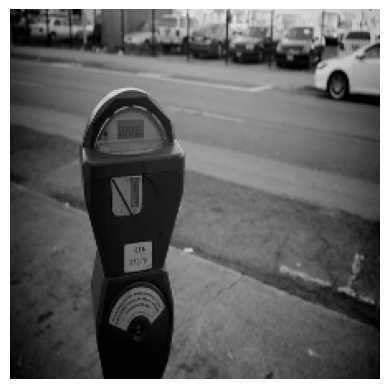

 a parking meter is shown. the sign is covering the sidewalk. the sign is at a pole. the sign is white with a coin slot. there is a sticker on the sidewalk. the sign is black with yellow on it.


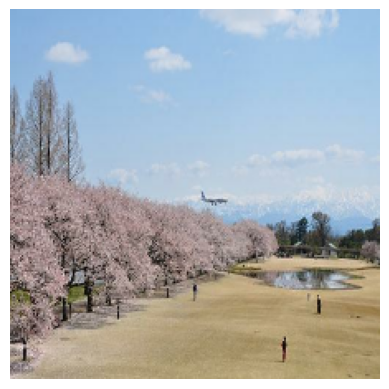

 a green and yellow bird is perched on a beach in a field of grass. there are lots of green trees surrounding the trees. the field has green and yellow flowers. there are no clouds in the sky.


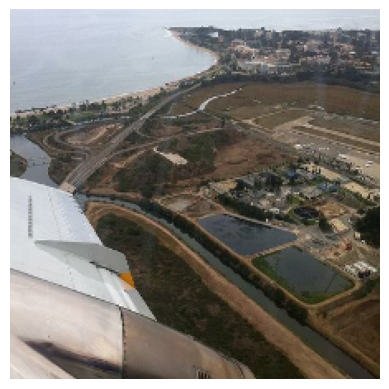

 a plane is on the airplane tracks. the airplane is white and white and has a strip of windows. there are trees on the strip of water. beyond the airplane there are trees with trees on the sky. there are trees on the grass. there is a flag on the


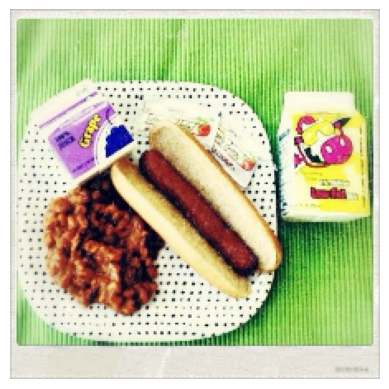

 a white, plastic and blue food is sitting on a white, the wall next to a white, plastic with different pieces on pepperoni and cheese sauce. a plastic plastic part of a plastic plastic sauce. the food is on a white, sauce. a plastic plastic plastic board is next to


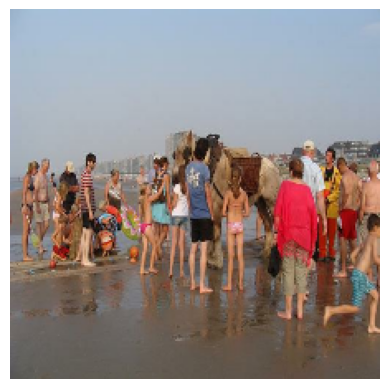

 a man in a blue shirt and a white collar is walking on a sandy beach. the man is shirtless and wearing a blue shirt and orange swim trunks. the man on the end of the camera is looking at the camera and on the end of his top is


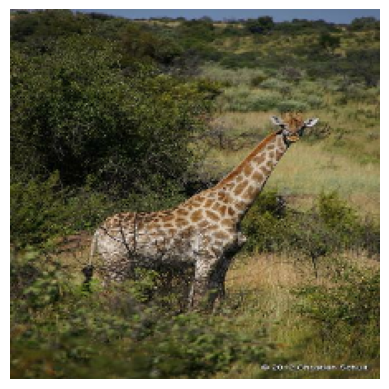

 a tall giraffe is standing on a grassy area in a field. the field is covered in green grass and tall trees. the trees are partially on the ground and are on the ground below the trees. the sky is blue and some clouds are white and some clouds are


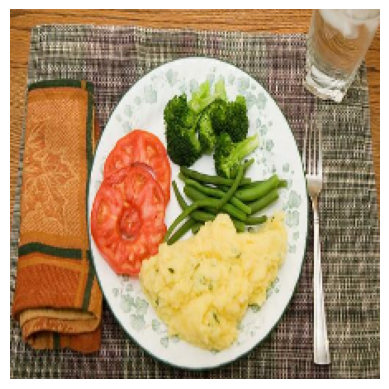

 a plate of food is on top of a wooden table. the plate holds food and meat. the plate on the plate is square and square. the plate is on the table and chives on top of the plate. the plate has two carrots and chopped scallions and meat. a


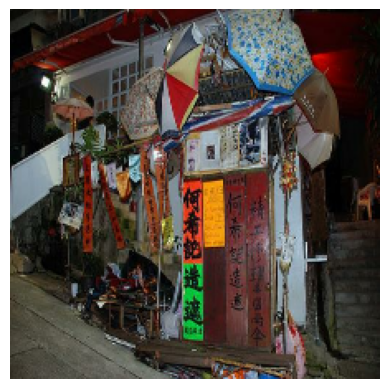

 a display of orange and orange objects are buy their skin in a wet park area. the backpack on the orange is filled with wet spots hanging from the display top. there are two walking past the head of the building. a tall and yellow umbrella is on the side


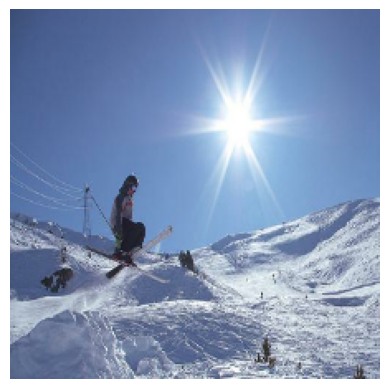

 a person wearing a green jacket and blue pants is full of snow on a snowy field on a snowy field on a bright ramp. there is a snow covered cone in the snow. there are several tracks in the snow covered in snow. there are a bunch of snow


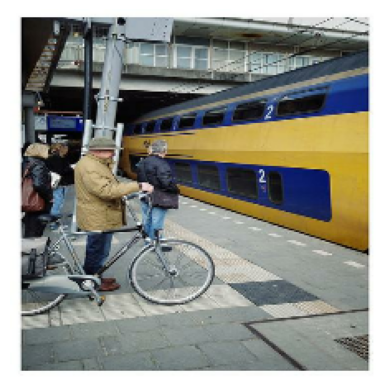

 a man in a red shirt and a white shirt is riding a train on a train next to a train with her head on her sidewalk. the train is stopped on a train with a train lamp next to it. the train tracks on the street is blue with


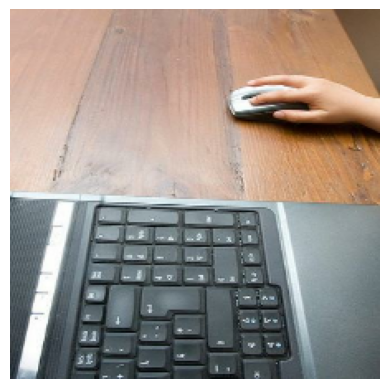

 a grey haired black and silver monitor is sitting on a table in a stack of a laptop computer. the computer keyboard is open and the keyboards are white. the computer digital keyboard and is on the second desk. part of a bottle of water can be seen beside the


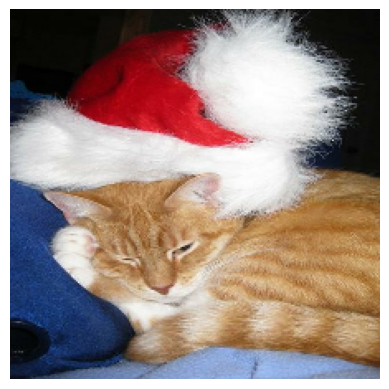

 a tan blue bear with tan stripes on it's a tan which is sitting next to a tan wooden cat. the tan and tan blue fur is sitting next to a tan wooden chair which is sitting next to a red wooden bag. the man is sitting on a tan


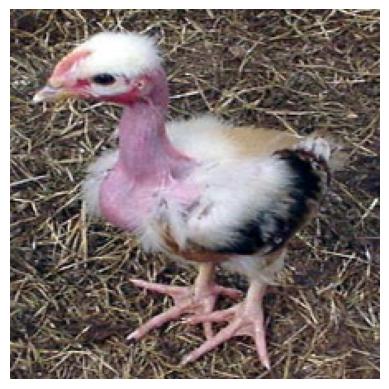

 the little riding the train is sitting on the tracks the tracks by the pen is mostly brown. the ground is made of grass and some of the little little cloud is made of some of some some than some cloud of some little brown. the tracks around the train


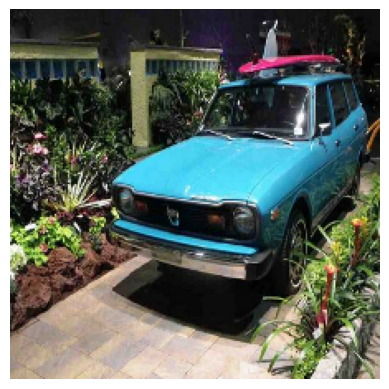

 a car parked in a parking car parked at a car parked in the parking lot in the parking lot in the parking lot in the parking lot in the parking lot in the parking lot in the parking lot in the parking lot the car parked in the parking


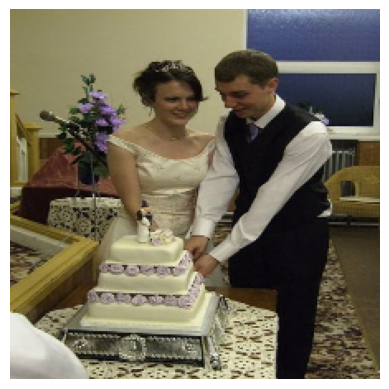

 there are two people standing in a room. there are two people sitting on top of the cake. they are on a top of a brown colored cake. they are on a top of a shelf covered with white flowers. there are two people on the table. on the table


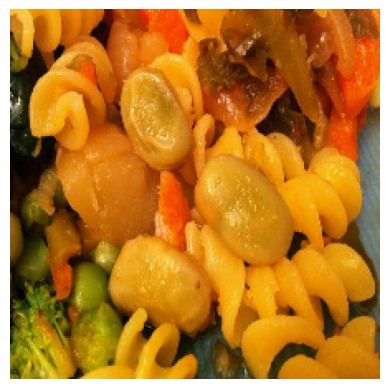

 a white bowl of vegetables on top of a white bowl which is next to a white bowl on a white table. the bowl is shaped and cut into a clear and green colored thin colored bowl on the top of a white bowl on the top of the plate.


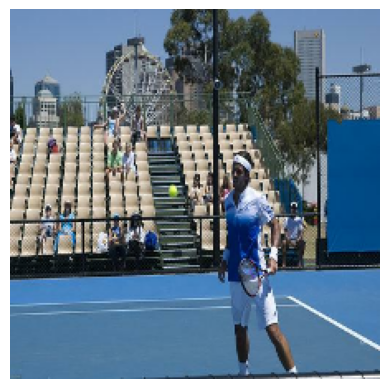

 a game of tennis is on a tennis court. the ball is white in the air and the ball is about to swing the court. the ball is in front of a ball that is soaring towards him. a large green fence is behind the court. a tall green fence


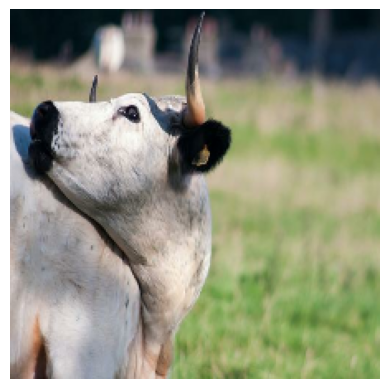

 a black cow is walking on the grass. there is a fence in the distance behind the cow. there are some white poles in the field of some of the area.


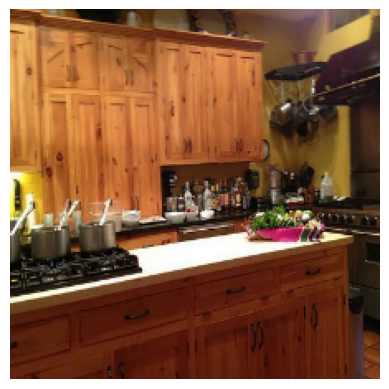

 a white wall with a bright yellow vase on top of it. there is a black and white wall behind the wall. there is a vase of food in front of the wall with a vase of flowers in front of it. there is a white vase with a vase


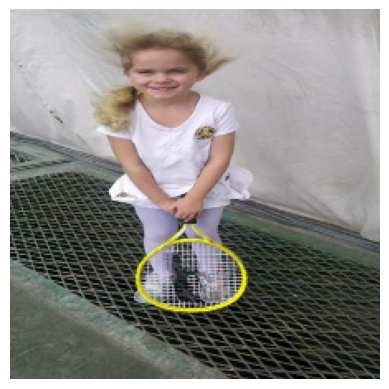

 a female wearing a white shirt and a white shirt and a white polka part of a skirt. the girl is holding a white baseball in her hand. the sidewalk is behind a colorful car that is in the air. a large black car is walking behind the tree.


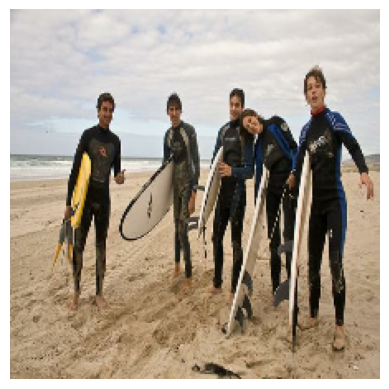

 a man in a blue shirt and blue pants is standing on a bench in the middle of a beach. the man is facing the outside of his outside on a blue shirt and sunglasses. he is holding his arm. the surfboard is blue and behind the person. the man


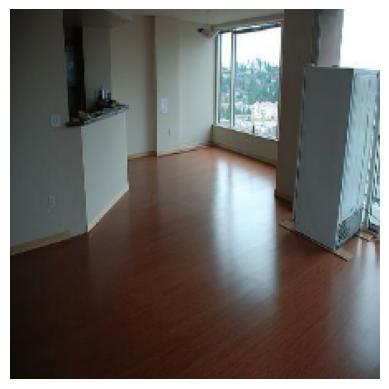

 a room has a lot of wood and on top of it. the window is made of wood and there is a wood table in the room. there is a red garbage can on the other side of the room. there is a window on the other side of the


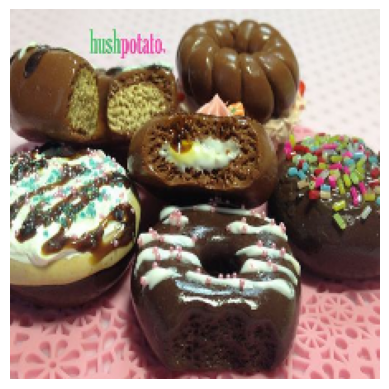

 a white plate sits on a white table. there are white frosting on top of the plate. there are white frosting branches surrounding the top of the plate and to the right of the plate are made of white frosting and other slices of bread are on top of the


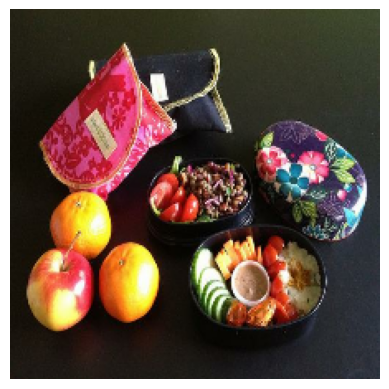

 a table with a clear glass case on it. there are also illuminated on plates on the table. there are paper plates on the table. there are also illuminated on top of the table. there are paper plates on the table. there are also white paper plates on the table.


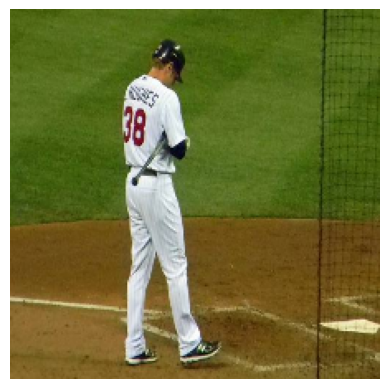

 the base of a baseball player is on the ground ready to swing the ball. the base of the base is white and the base is white and has a number 1 in red and white base on the bottom. the lines on the base of the base is a


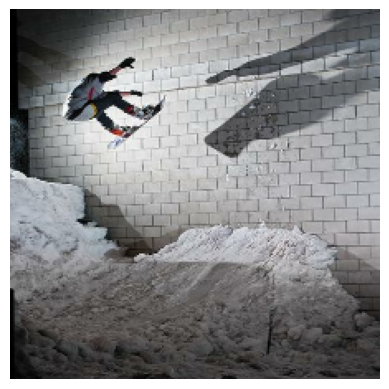

 a man is in a snowboard and wearing a red and white striped shirt. there is a snowboard off in the center of the man above the snowboard and there is a snowboard on the snowboard that is up to the right of the man. the man is in a


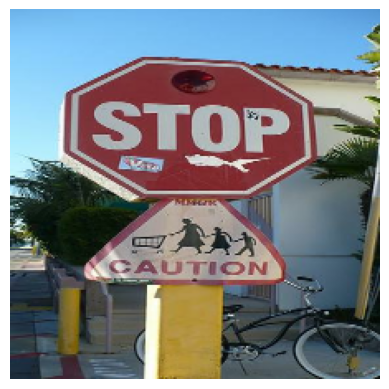

 a stop sign is under the stop signs. the sign is white and there are several signs running on the pole. the sign is under the same sign. the sky is blue and the sky is clear and blue. there are cars on the sidewalk.


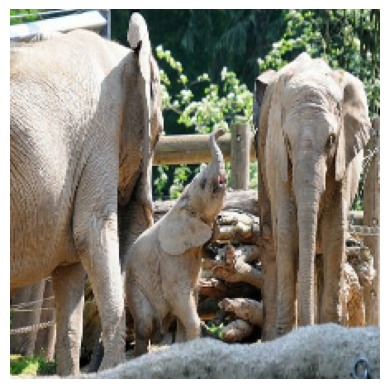

 a small elephant is standing on the ground. there is a wood fence behind the elephant that is standing by the dirt of the elephant that is standing on the ground next to the elephant and some type of fence can be seen. both of the elephants are standing on


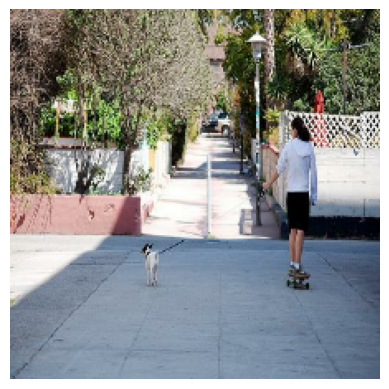

 a man is walking on a skateboard outside on a sunny day. he is wearing a short sleeve shirt, jeans and shorts. the man is holding a cut commercial street in his hands. a man is walking past the street with a white plastic stick. on the street is a


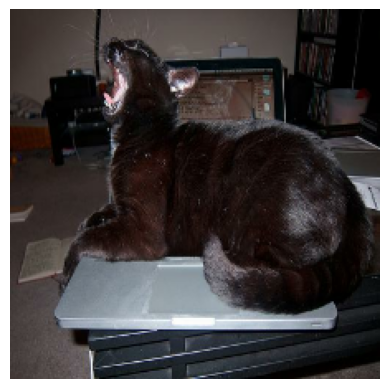

 a cat is laying on a red wooden computer. the cat is wearing a white and blue short sleeved shirt. the cat on the left is looking up towards a computer. the cat is looking into the computer. the cat is looking into the computer. the cat on the left


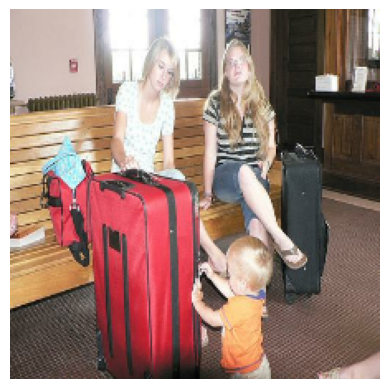

 a young girl in a long part of a woman in a part and holding a piece of luggage is sitting on a luggage at a suitcase. the girl is sitting on a table that is in a suitcase. the man in the room is sitting in a room. part


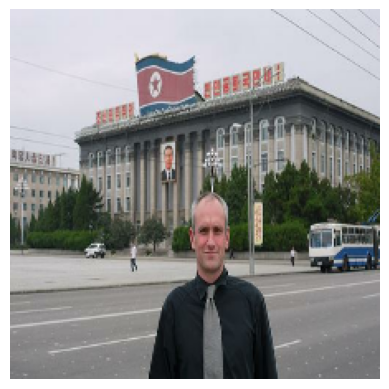

 a man in a black suit is holding a large white tie. the man holding her hands are in a black and white tie. the man holding a white and white face suit is facing the man. the sky is blue and there are many tall buildings. behind the building


In [15]:
#loop to print results on test dataset..
from tqdm.notebook import tqdm
n = 60
plt.figure(figsize = (5,5)) #create figure size
i = 0
output_caption_list = []
for image in tqdm(test_ds.take(n)):
    plt.imshow(image.numpy().astype("uint8"))
    plt.axis("off")
    plt.show()
    encoder = tf.keras.layers.Rescaling(scale = 1/255)(image)
    inputs = image_processor(encoder, return_tensors = "tf", do_rescale = False)
    outputs = modelpre(**inputs)
    image_embedding = np.reshape(outputs.last_hidden_state.numpy(), [197,768])
    #print(image_embedding.shape)
    text = caption(image_embedding)
    print(text)
    output_caption_list.append(text)
    i = i + 1

To see the checkpoints technique while training, refer to this [link](http://https://www.tensorflow.org/tutorials/keras/save_and_load)

<h3> Saving and Visualising the model </h3>

In [16]:
model2.save_weights("Partb_Final_Weights.weights.h5")

In [17]:
model2.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None,)]                    0         []                            
                                                                                                  
 text_vectorization (TextVe  (None, 90)                   0         ['input_2[0][0]']             
 ctorization)                                                                                     
                                                                                                  
 embedding (Embedding)       (None, 90, 768)              1050163   ['text_vectorization[0][0]']  
                                                          2                                       
                                                                                              

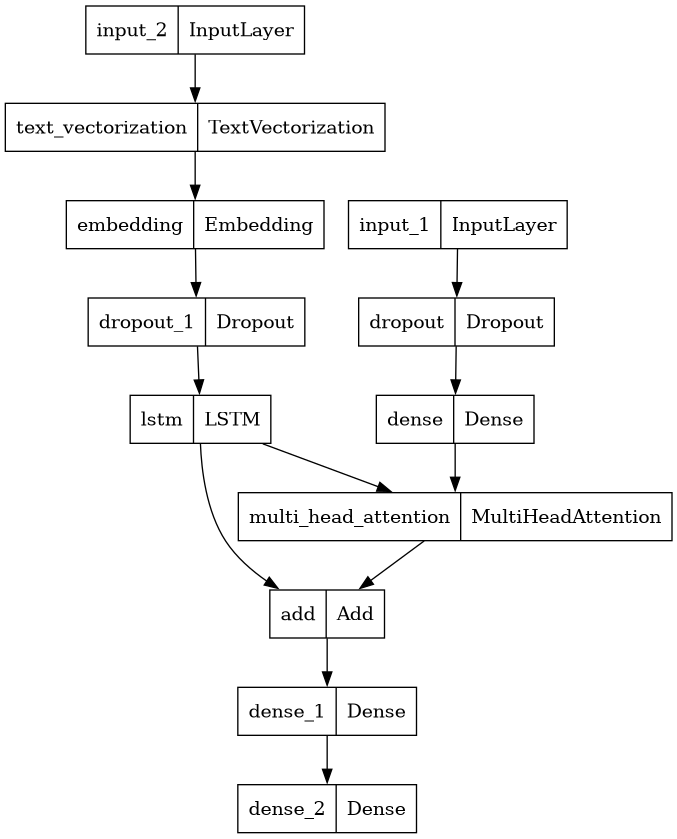

In [18]:
tf.keras.utils.plot_model(model2, show_layer_names=True)

<h3> Saving the captions to a csv file </h3>

In [19]:
captions = pd.DataFrame(output_caption_list)
captions.to_csv("encoder_VIT_decoder_LSTM_Partb_70epoch")

<h3> Model Evaluation </h3>

In [20]:
candidates_b = captions[0]
reference=test_file['caption']
reference.index=range(0,len(reference))

In [21]:
candidates_dict_b={}
for j,i in enumerate(candidates_b):
    candidates_dict_b[j]=[i]
references_dict_b={}
for j,i in enumerate(reference[0:60]):
    references_dict_b[j]=[i]

In [22]:
rouge_scorer = Rouge()
cider_scorer = Cider()
spice_scorer = Spice()
bleu_scorer = Bleu()
#Metric Calculation for part B
rouge_score_b = rouge_scorer.compute_score(references_dict_b, candidates_dict_b)

# Compute CIDEr score
cider_score_b, _ = cider_scorer.compute_score(references_dict_b, candidates_dict_b)

# Compute SPICE score - Added code
spice_score_b, _ = spice_scorer.compute_score(references_dict_b, candidates_dict_b)

# Compute Bleu score 
bleu_score_b, _ = bleu_scorer.compute_score(references_dict_b, candidates_dict_b)

print("ROUGE Score Part B:", rouge_score_b[0])
print("CIDEr Score Part B:",cider_score_b)
print("SPICE Score Part B:", spice_score_b)
print("BLEU Score Part B:", bleu_score_b)

Progress: 384.5M / 384.5M (100.0%)
Extracting stanford-corenlp-3.6.0 ...
Done.


Parsing reference captions
Initiating Stanford parsing pipeline
[main] INFO edu.stanford.nlp.pipeline.StanfordCoreNLP - Adding annotator tokenize
[main] INFO edu.stanford.nlp.pipeline.TokenizerAnnotator - TokenizerAnnotator: No tokenizer type provided. Defaulting to PTBTokenizer.
[main] INFO edu.stanford.nlp.pipeline.StanfordCoreNLP - Adding annotator ssplit
[main] INFO edu.stanford.nlp.pipeline.StanfordCoreNLP - Adding annotator parse
[main] INFO edu.stanford.nlp.parser.common.ParserGrammar - Loading parser from serialized file edu/stanford/nlp/models/lexparser/englishPCFG.ser.gz ... 
done [0.7 sec].
[main] INFO edu.stanford.nlp.pipeline.StanfordCoreNLP - Adding annotator lemma
[main] INFO edu.stanford.nlp.pipeline.StanfordCoreNLP - Adding annotator ner
Loading classifier from edu/stanford/nlp/models/ner/english.all.3class.distsim.crf.ser.gz ... done [1.3 sec].
Loading classifier from edu/stanford/nlp/models/ner/english.muc.7class.distsim.crf.ser.gz ... done [0.7 sec].
Loading classif

SPICE evaluation took: 34.04 s
{'testlen': 2925, 'reflen': 2896, 'guess': [2925, 2865, 2805, 2745], 'correct': [946, 221, 49, 16]}
ratio: 1.0100138121543474
ROUGE Score Part B: 0.22808143923331264
CIDEr Score Part B: 0.08174556696387386
SPICE Score Part B: 0.11522581910807503
BLEU Score Part B: [0.32341880341869284, 0.15794884580214263, 0.07581678703356297, 0.03992256534520557]
